Calculate the Bayes Factor for $M_*$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

# import pocomc as pc
import corner

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
Mstar_NSA = np.log10(catalog_main['ELPETRO_MASS'])

/tmp/ipykernel_43340/3956203993.py:1: RuntimeWarning: divide by zero encountered in log10
  Mstar_NSA = np.log10(catalog_main['ELPETRO_MASS'])


## Separate galaxies by their LSS classifications

### $V^2$

In [6]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [7]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [8]:
del catalog_main, catalog_north, data

# Fit the stellar mass distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [9]:
Mstar_bins = np.arange(7.5, 11.5, 0.1)

In [10]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## V$^2$

### 1-parent model

#### Void v. wall

In [11]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-20241108.pickle', 'rb')
# V2_results1 = pickle.load(temp_infile)
V2_results1_samples, lnzM1_V2 = pickle.load(temp_infile)
temp_infile.close()

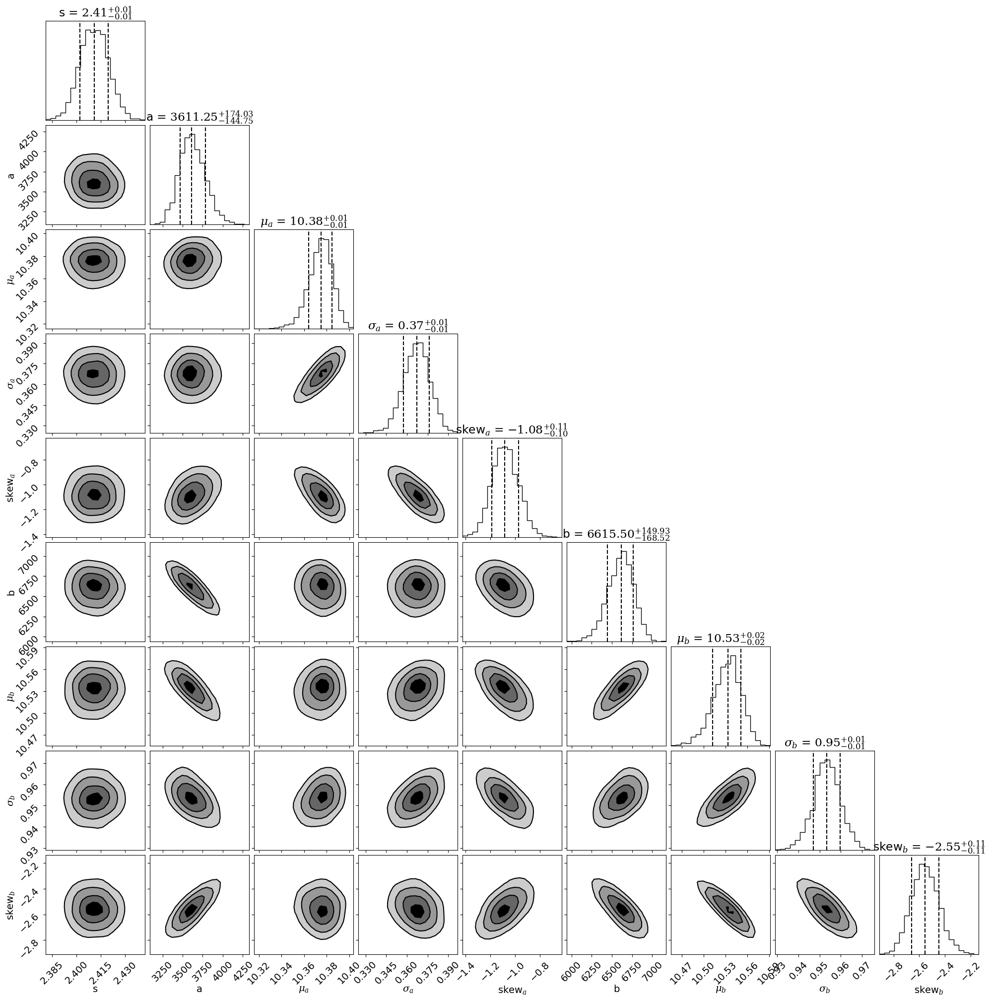

In [12]:
# pc.plotting.corner(V2_results1, 
corner.corner(V2_results1_samples,
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [13]:
# lnzM1_V2 = V2_results1['logz'][-1]
lnzM1_V2

np.float64(-985.996970351444)

In [14]:
# V2_bestfit1 = np.median(V2_results1['samples'], axis=0)
V2_bestfit1 = np.median(V2_results1_samples, axis=0)
V2_bestfit1

array([ 2.41106948e+00,  3.61124940e+03,  1.03750974e+01,  3.67180231e-01,
       -1.08369775e+00,  6.61549721e+03,  1.05334179e+01,  9.53337440e-01,
       -2.55453953e+00])

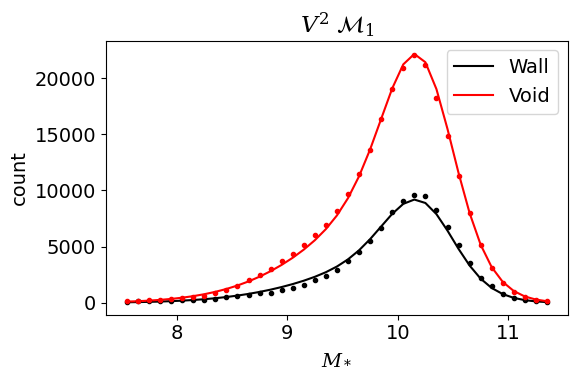

In [15]:
Model_1_plot(V2_bestfit1, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Wall v. all

In [16]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2wall-20241108.pickle', 'rb')
V2wall_results1_samples, lnzM1_V2wall = pickle.load(temp_infile)
temp_infile.close()

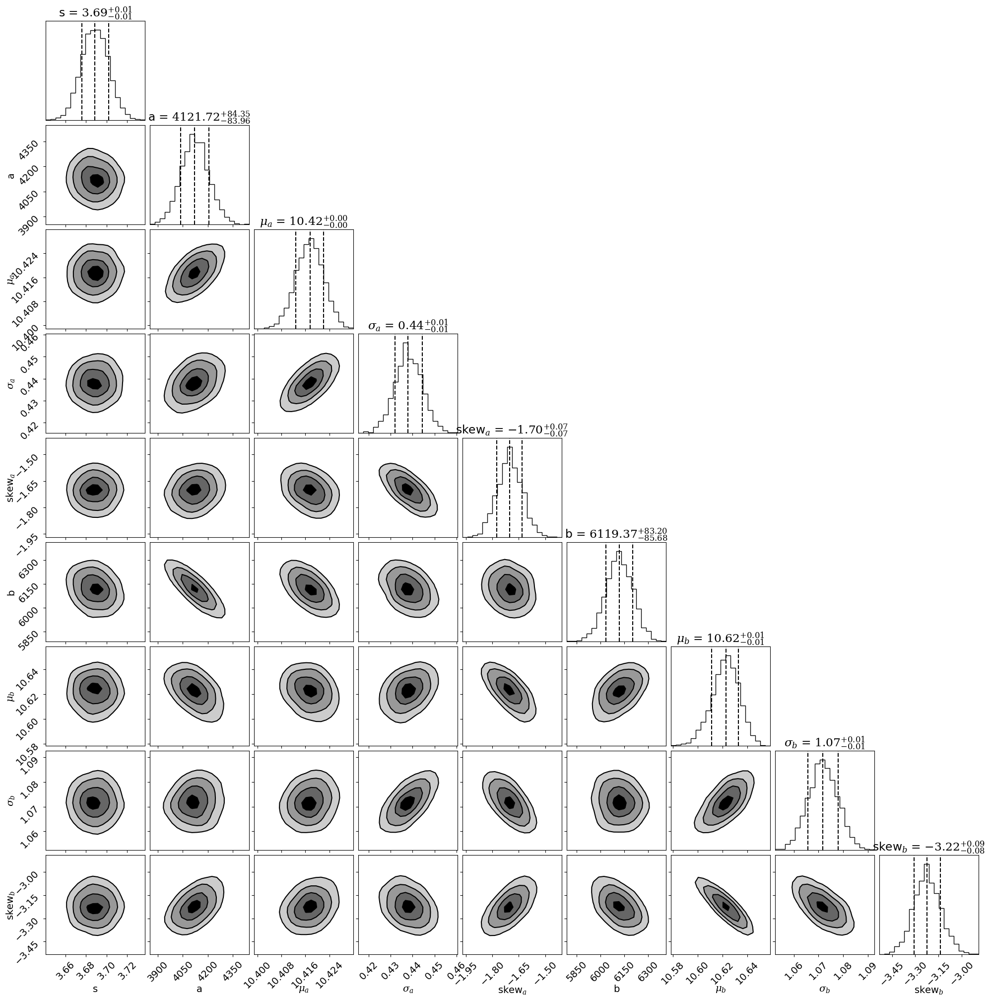

In [17]:
corner.corner(V2wall_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [18]:
lnzM1_V2wall

np.float64(-955.6228217133585)

In [19]:
V2wall_bestfit1 = np.median(V2wall_results1_samples, axis=0)

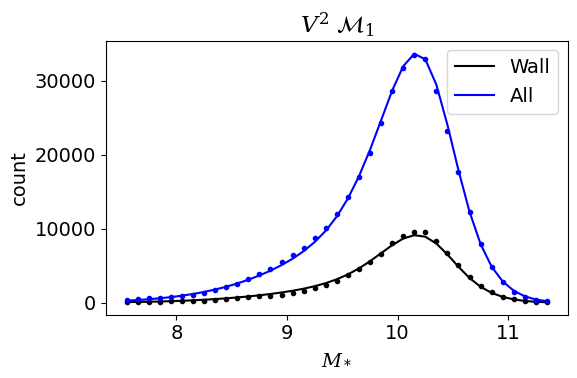

In [20]:
Model_1_plot(V2wall_bestfit1, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2 | wall_v2 | edge_v2], 
             Mstar_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Void v. all

In [21]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2void-20241108.pickle', 'rb')
V2void_results1_samples, lnzM1_V2void = pickle.load(temp_infile)
temp_infile.close()

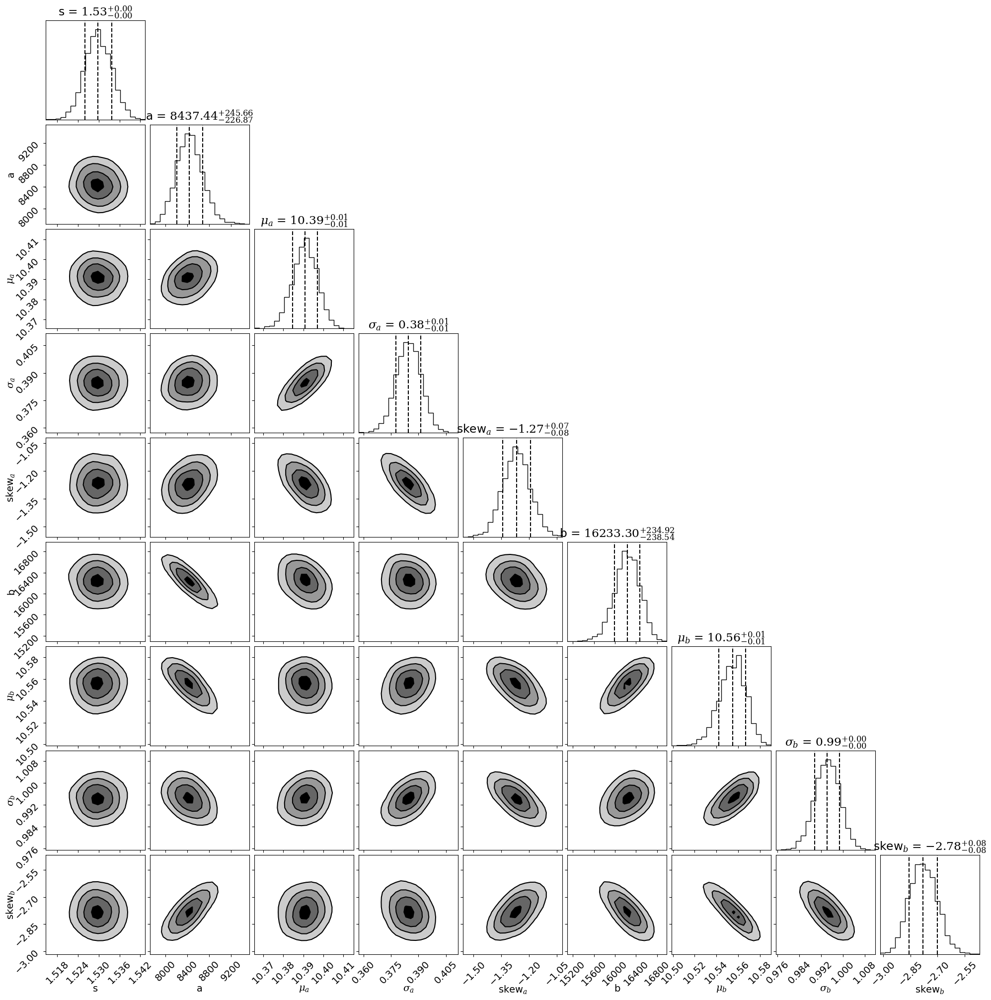

In [22]:
corner.corner(V2void_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [23]:
lnzM1_V2void

np.float64(-952.402287920923)

In [24]:
V2void_bestfit1 = np.median(V2void_results1_samples, axis=0)

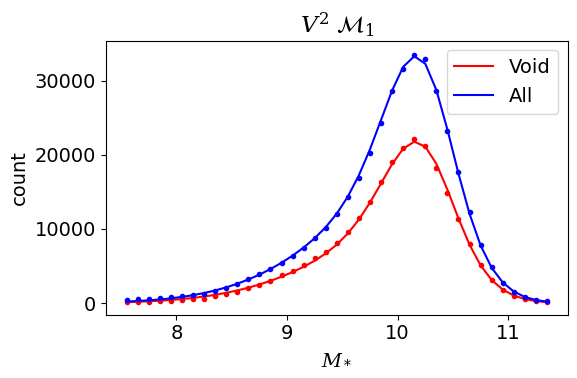

In [25]:
Model_1_plot(V2void_bestfit1, 
             Mstar_NSA[void_v2], 
             Mstar_NSA[void_v2 | wall_v2 | edge_v2], 
             Mstar_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [26]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-20241108.pickle', 'rb')
# V2_results2 = pickle.load(temp_infile)
V2_results2_samples, lnzM2_V2 = pickle.load(temp_infile)
temp_infile.close()

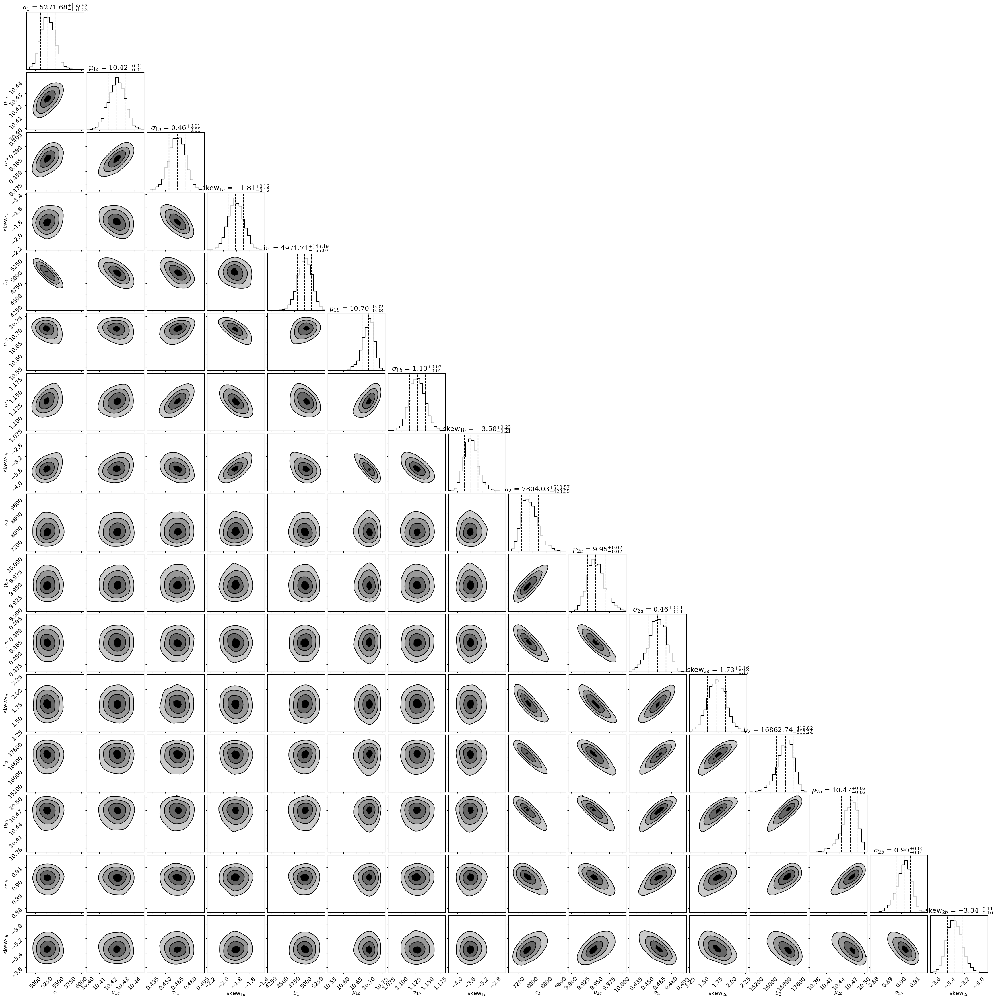

In [27]:
# pc.plotting.corner(V2_results2, 
corner.corner(V2_results2_samples,
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [28]:
# lnzM2_V2 = V2_results2['logz'][-1]
lnzM2_V2

np.float64(-519.2272891689316)

In [29]:
# V2_bestfit2 = np.median(V2_results2['samples'], axis=0)
V2_bestfit2 = np.median(V2_results2_samples, axis=0)
V2_bestfit2

array([ 5.27168457e+03,  1.04249914e+01,  4.64305770e-01, -1.81449206e+00,
        4.97171122e+03,  1.06984265e+01,  1.12957360e+00, -3.58036263e+00,
        7.80403341e+03,  9.94792206e+00,  4.62499053e-01,  1.73104467e+00,
        1.68627443e+04,  1.04664087e+01,  9.02116297e-01, -3.33991852e+00])

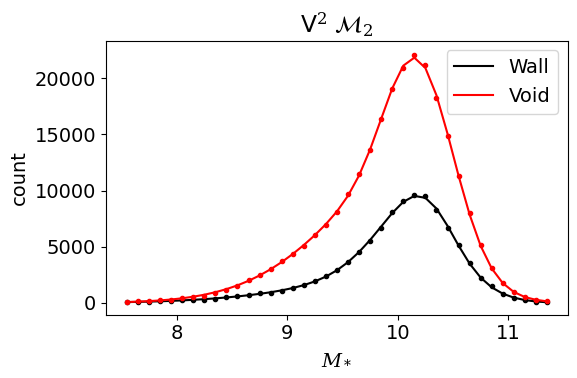

In [30]:
Model_2_plot(V2_bestfit2, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'V$^2$ $\mathcal{M}_2$');

#### Wall v. all

In [31]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2wall-20241108.pickle', 'rb')
V2wall_results2_samples, lnzM2_V2wall = pickle.load(temp_infile)
temp_infile.close()

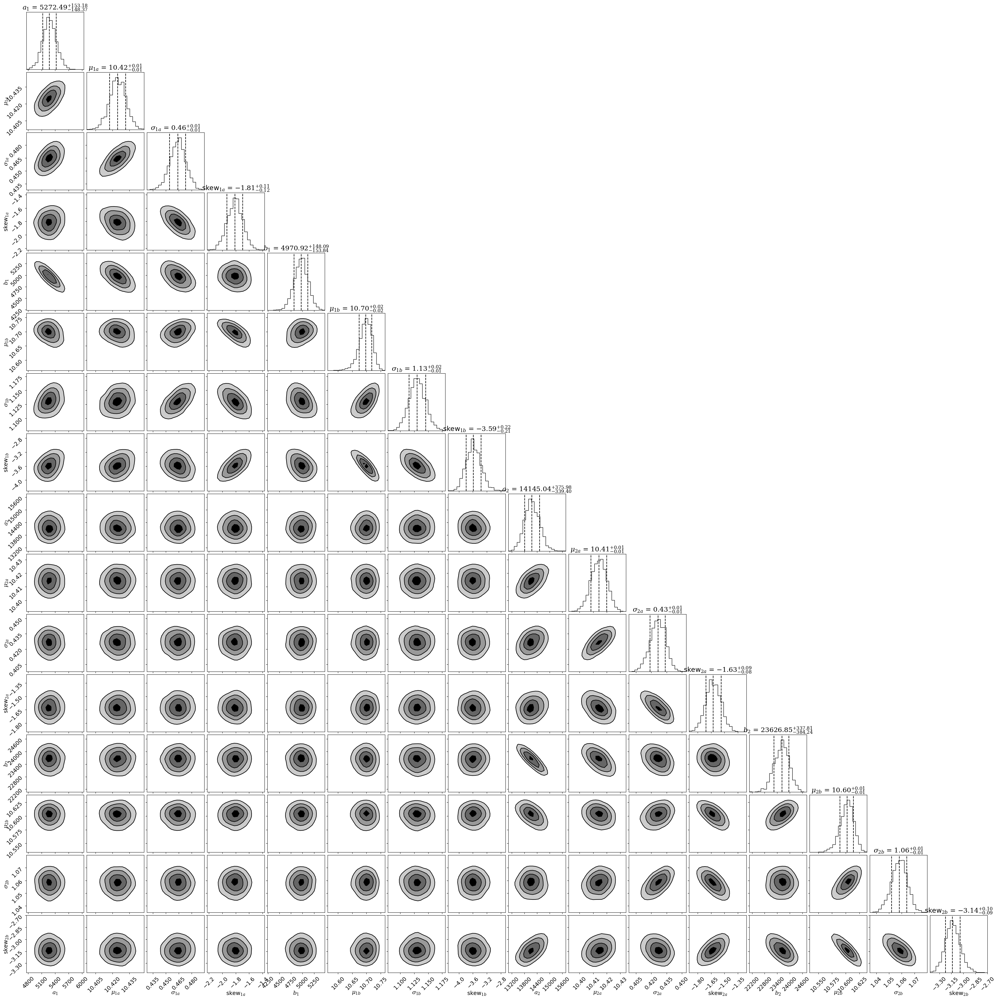

In [32]:
corner.corner(V2wall_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [33]:
lnzM2_V2wall

np.float64(-615.674700865344)

In [34]:
V2wall_bestfit2 = np.median(V2wall_results2_samples, axis=0)

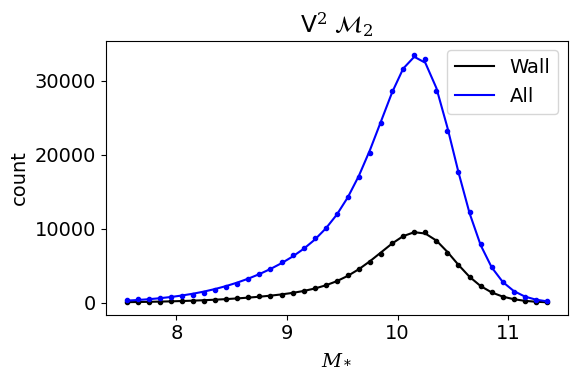

In [35]:
Model_2_plot(V2wall_bestfit2, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2 | wall_v2 | edge_v2], 
             Mstar_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'V$^2$ $\mathcal{M}_2$');

#### Void v. all

In [40]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2void-20241108.pickle', 'rb')
V2void_results2_samples, lnzM2_V2void = pickle.load(temp_infile)
temp_infile.close()

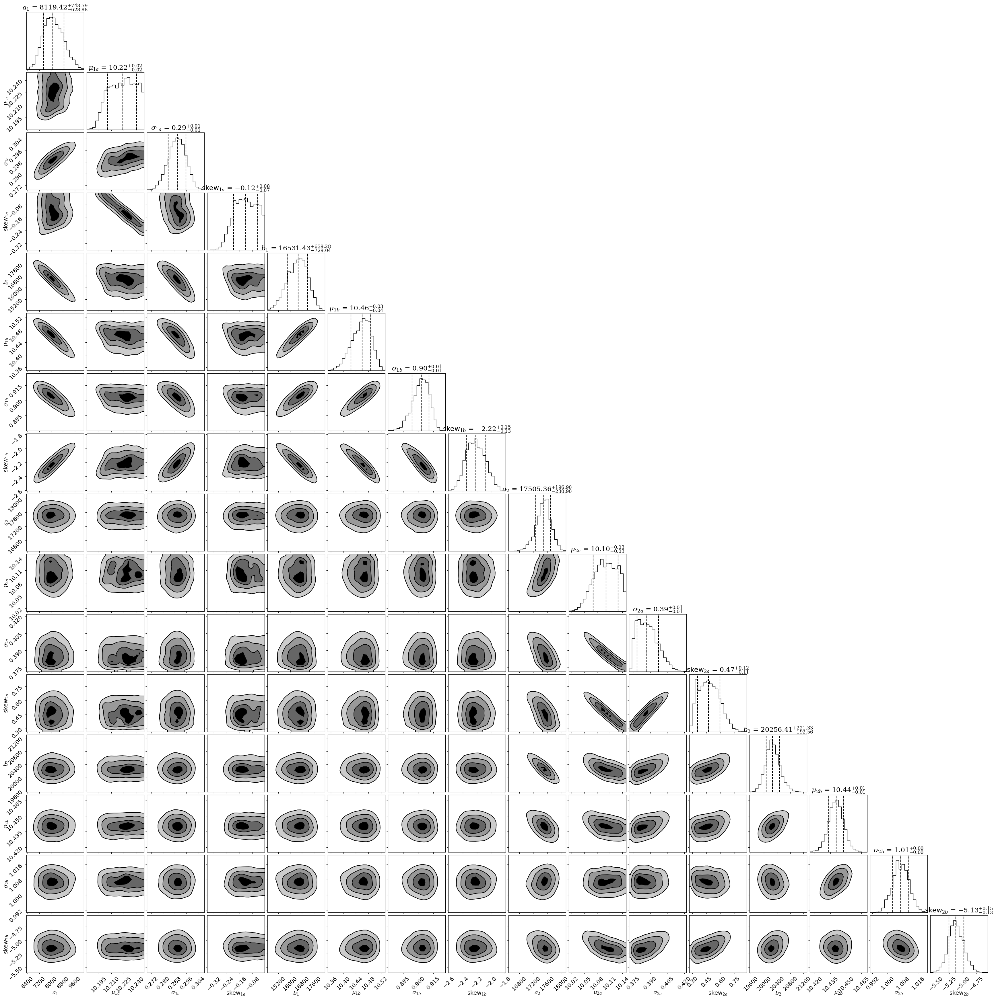

In [41]:
corner.corner(V2void_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [42]:
lnzM2_V2void

np.float64(-701.2814486913387)

In [43]:
V2void_bestfit2 = np.median(V2void_results2_samples, axis=0)

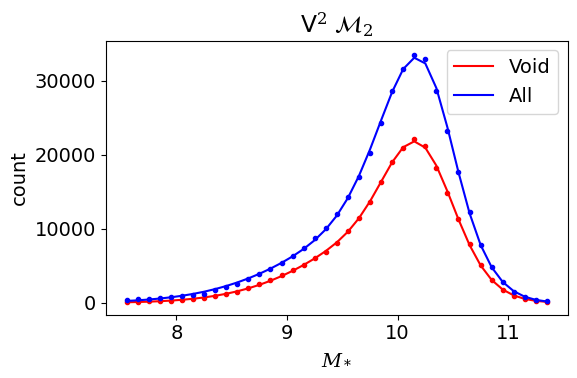

In [44]:
Model_2_plot(V2void_bestfit2, 
             Mstar_NSA[void_v2], 
             Mstar_NSA[void_v2 | wall_v2 | edge_v2], 
             Mstar_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'V$^2$ $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [38]:
lnB12_V2 = lnzM1_V2 - lnzM2_V2

B12_V2 = np.exp(lnB12_V2)

print('V2 (void v. wall) Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2, lnB12_V2*np.log10(np.exp(1))))

V2 (void v. wall) Mstar: B12 = 1.93e-203; log(B12) = -202.715


#### Wall v. all

In [39]:
lnB12_V2wall = lnzM1_V2wall - lnzM2_V2wall

B12_V2wall = np.exp(lnB12_V2wall)

print('V2 (wall v. all) Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2wall, lnB12_V2wall*np.log10(np.exp(1))))

V2 (wall v. all) Mstar: B12 = 2.3e-148; log(B12) = -147.638


#### Void v. all

In [45]:
lnB12_V2void = lnzM1_V2void - lnzM2_V2void

B12_V2void = np.exp(lnB12_V2void)

print('V2 (void v. all) Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2void, lnB12_V2void*np.log10(np.exp(1))))

V2 (void v. all) Mstar: B12 = 8.7e-110; log(B12) = -109.060


## VoidFinder

### 1-parent model

In [10]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

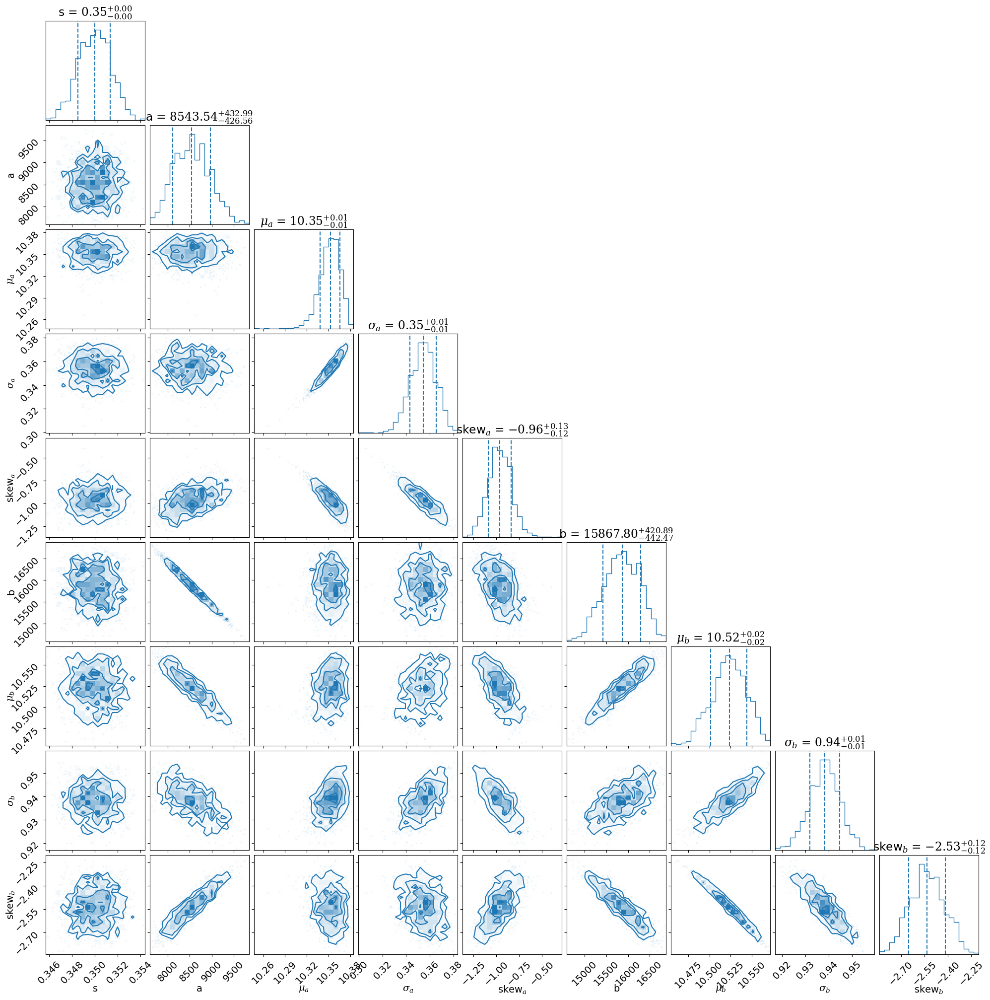

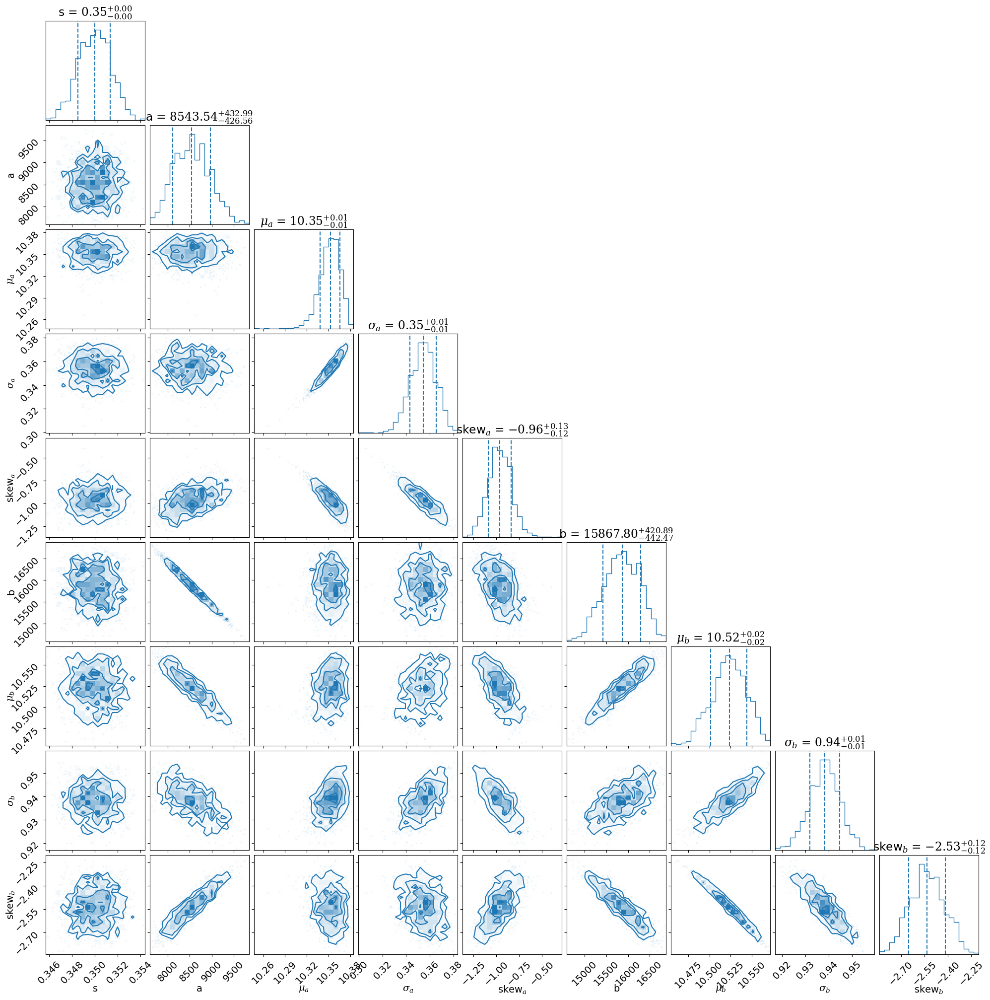

In [11]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [12]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-4430.584425551687

In [13]:
VF_bestfit1 = np.mean(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4994298e-01,  8.5530371e+03,  1.0351464e+01,  3.5402861e-01,
       -9.5991808e-01,  1.5855135e+04,  1.0522739e+01,  9.3813288e-01,
       -2.5319936e+00], dtype=float32)

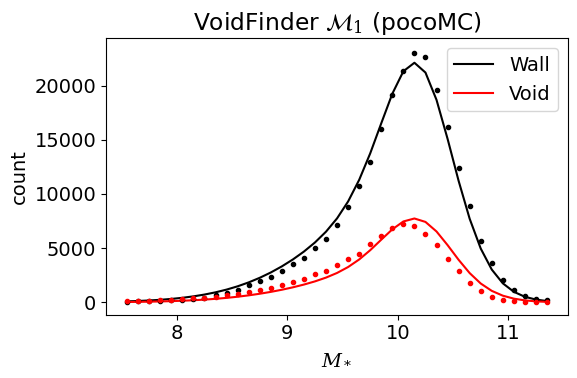

In [14]:
Model_1_plot(VF_bestfit1, 
             Mstar_NSA[wall_vf], 
             Mstar_NSA[void_vf], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'VoidFinder $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [17]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_VoidFinder.pickle', 'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

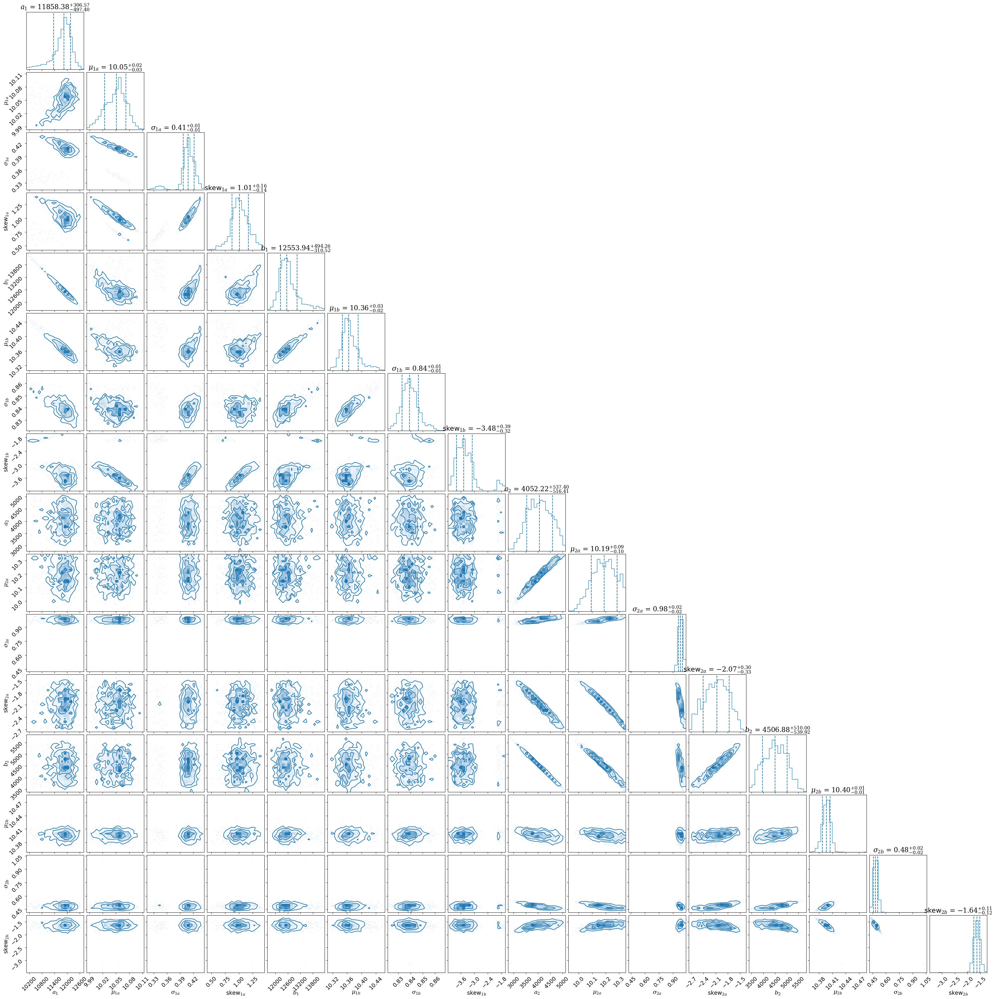

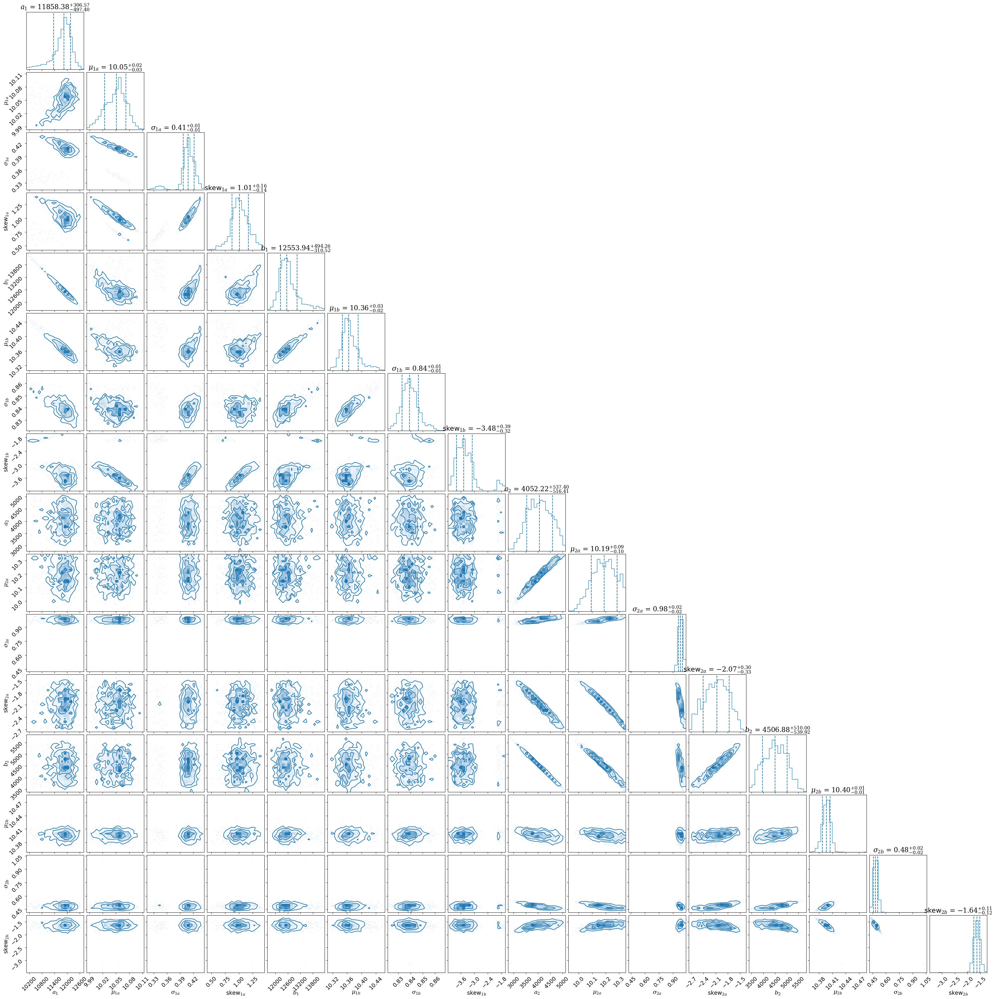

In [18]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [19]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-498.6525290965741

In [20]:
VF_bestfit2 = np.mean(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 1.17590059e+04,  1.00487585e+01,  4.06108469e-01,  1.01745892e+00,
        1.26409258e+04,  1.03684893e+01,  8.39587152e-01, -3.37871289e+00,
        4.04974341e+03,  1.01873369e+01,  9.79010165e-01, -2.07926798e+00,
        4.50512793e+03,  1.03964491e+01,  4.85823452e-01, -1.64310801e+00],
      dtype=float32)

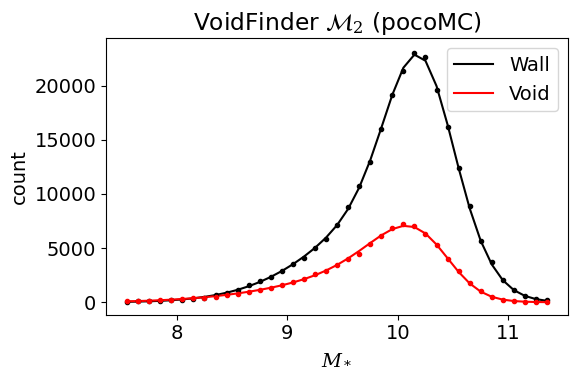

In [21]:
Model_2_plot(VF_bestfit2, 
             Mstar_NSA[wall_vf], 
             Mstar_NSA[void_vf], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'VoidFinder $\mathcal{M}_2$ (pocoMC)')

### Bayes Factor

In [22]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder Mstar: B12 = 0; log(B12) = -1707.616


So both VoidFinder and V$^2$ favor $\mathcal{M}_2$, in which the two data sets come from different parent distributions, although VoidFinder favors it much more than V$^2$.